<a href="https://colab.research.google.com/github/MiitaliGupta/MachineLearning/blob/main/Multiple%20Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Multiple Regression

Team 3

Mitali Gupta 2041153
vaibhav Gupta 2041138
Ayushman Gurung 2041107
Shareqa Tasneem 2041065
shreeya Bajpai 2041061

Importing the necessary libraries 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.linear_model import LinearRegression

#**DATASET 1**

Reading the dataset using URL

In [ ]:
dataset = pd.read_csv("https://raw.githubusercontent.com/MiitaliGupta/MachineLearning/main/Datasets/Students.csv")
dataset.head(5)

,S.No.,BMI,Age,Height,Weight
0,1,22.5,21.0,175.0,68.8
1,2,23.1,22.0,165.0,63.0
2,3,20.9,21.0,165.0,57.0
3,4,20.2,20.0,165.0,55.0
4,5,22.8,24.0,165.0,62.0


**Exploratory Data Analysis**

In [ ]:
dataset.shape

(128, 5)

In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   S.No.   128 non-null    int64  
 1   BMI     124 non-null    float64
 2   Age     125 non-null    float64
 3   Height  126 non-null    float64
 4   Weight  125 non-null    float64
dtypes: float64(4), int64(1)
memory usage: 5.1 KB


In [ ]:
dataset.duplicated().value_counts()

False    128
dtype: int64

**Handling Null Values**

We first check if the dataset contains any null values

isna checks if a value is null or not, and sum is used to count all the values that return true for isna

In [ ]:
numeric=dataset.select_dtypes(include=np.number)
numeric_columns=numeric.columns
dataset.isna().sum()

S.No.     0
BMI       4
Age       3
Height    2
Weight    3
dtype: int64

Here we see that we have 4 null values in BMI, 3 in Age, 2 in Height and 3 in Weight

In order to handle these null values, we replace them with their respective means. 

In [ ]:
dataset[numeric_columns]=dataset[numeric_columns].fillna(dataset.mean())
dataset.isna().sum()

S.No.     0
BMI       0
Age       0
Height    0
Weight    0
dtype: int64

Now after counting, we see that there are no more null values present

**Multiple Linear Regression**


It is the method of predicting a target variable (also known as dependent variable) with two or more predictors (also known as independent variable)

**Equation :** Y = b0 + b1 * x1 + b2 * x2 + b3 * x3 + …… bn * xn 


where, Y = Dependent variable and x1, x2, x3, …… xn = multiple independent variables

b1, b2 and b3 are the coefficients of independent variables

--> For this particular dataset

**Equation :** BMI = y-intercept + (b1 * weight )+ (b2 * height) + (b3 * age)

**Splitting dataset into target and predictors**

X denotes the predictors, it consists of Age, Weight and Height

In [ ]:
X=dataset.drop(columns=['BMI', 'S.No.'], axis=1)
X

,Age,Height,Weight
0,21.0,175.0,68.8
1,22.0,165.0,63.0
2,21.0,165.0,57.0
3,20.0,165.0,55.0
4,24.0,165.0,62.0
...,...,...,...
123,27.0,165.0,78.0
124,24.0,175.0,66.0
125,23.0,165.0,67.0
126,24.0,185.0,73.0


Y denotes the target variable, which is BMI here

In [ ]:
y=dataset['BMI']
y

0      22.5
1      23.1
2      20.9
3      20.2
4      22.8
       ... 
123    28.7
124    21.6
125    24.6
126    21.3
127    23.5
Name: BMI, Length: 128, dtype: float64

**Visualisation**

These scatterplots show the relationship between the different independent variables and BMI

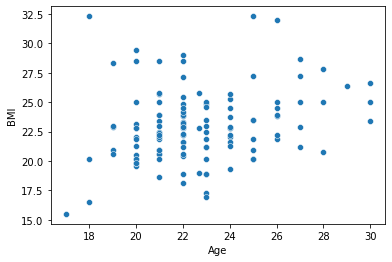

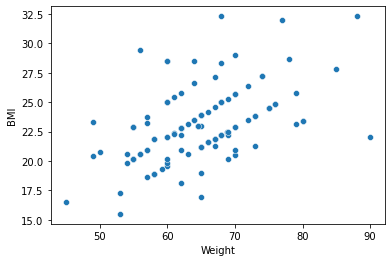

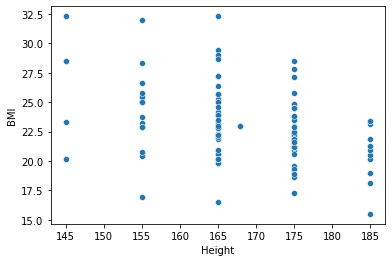

In [ ]:
#independent:Age, dependent:BMI
sns.scatterplot(x = dataset['Age'], y = dataset['BMI'])
plt.show()
#independent:Weight, dependent:BMI
sns.scatterplot(x = dataset['Weight'], y = dataset['BMI'])
plt.show()
#independent:Height, dependent:BMI
sns.scatterplot(x = dataset['Height'], y = dataset['BMI'])
plt.show()

**Correlation**

The below heatmap shows the degree of correlation between all the variables in the dataset

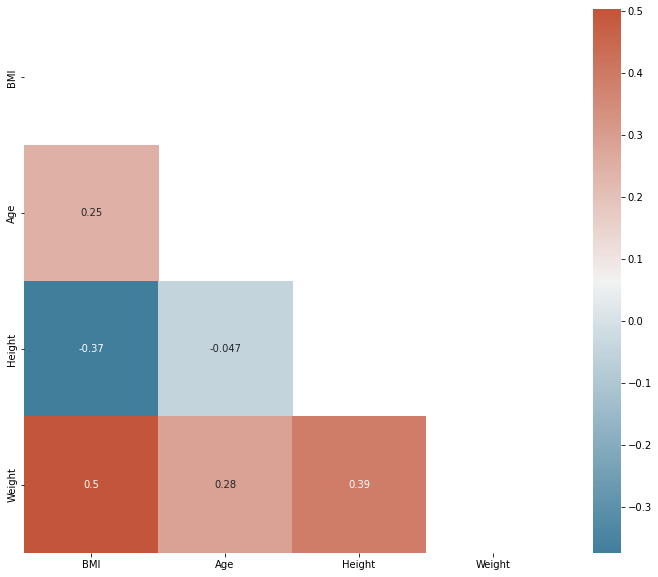

In [ ]:
df=dataset.drop('S.No.', axis=1)
corr = df.corr()
#
# Set up the matplotlib plot configuration
#
f, ax = plt.subplots(figsize=(12, 10))
#
# Generate a mask for upper traingle
#
mask = np.triu(np.ones_like(corr, dtype=bool))
#
# Configure a custom diverging colormap
#
cmap = sns.diverging_palette(230, 20, as_cmap=True)
#
# Draw the heatmap
#
sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

**Constructing a model**


Splitting the dataset into training and testing sets in a 70:30 ratio

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state = 42)

In [ ]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

Storing the predicted values in y_pred

In [ ]:
y_pred = regressor.predict(X_test)

Creating a dataframe of predicted and test values for better comparison

In [ ]:
d = {'y_pred': y_pred, 'y_test': y_test}

In [ ]:
pd.DataFrame(d)

,y_pred,y_test
55,20.698416,20.600000
40,25.101587,25.700000
19,21.362898,20.400000
31,22.475229,22.200000
98,19.445320,18.600000
56,22.199121,27.100000
69,22.609334,22.300000
104,23.684647,23.900000
81,23.128670,22.996774
26,20.691137,19.800000


**R^2 Score**

It is a coefficient of determination that shows how well the data fits the model

Calculating the R-squared scored 

In [ ]:
regressor.score(X_test,y_test)

0.7950130781800233

After Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(X_train)
x_test = sc.transform(X_test)
print(x_train)

[[-1.06126533  0.69223015 -0.60891855]
 [-0.678928    1.75985067 -0.85641928]
 [-0.29659067 -0.37539038  0.13358365]
 [ 0.85042133 -2.51063144  0.38108439]
 [ 0.468084    0.69223015 -0.70791884]
 [ 0.08574666  0.69223015  0.00983329]
 [ 2.37977065 -0.37539038  0.87608586]
 [ 0.08574666  1.75985067  0.50483476]
 [ 0.468084    0.69223015  1.24733696]
 [-0.29659067 -0.37539038 -0.36141781]
 [-0.678928   -0.37539038 -1.10392002]
 [-0.29659067  0.69223015 -0.85641928]
 [ 0.08574666  0.69223015  1.37108733]
 [-0.678928   -0.37539038  0.00983329]
 [-0.678928    1.75985067  0.62858512]
 [-1.06126533 -0.37539038 -0.85641928]
 [-0.678928   -0.37539038 -0.48516818]
 [ 0.08574666  0.69223015  0.25733402]
 [ 1.61509599 -0.37539038  0.38108439]
 [-1.06126533  1.75985067  0.62858512]
 [-1.06126533 -0.37539038 -1.10392002]
 [ 0.468084   -0.37539038 -0.36141781]
 [-2.20827732  1.75985067 -1.47517112]
 [-0.03660128  0.69223015  1.74233843]
 [-0.29659067 -0.37539038  0.00983329]
 [ 0.85042133 -0.37539038

In [ ]:
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

Storing the new predicted values in y_pred

In [ ]:
y_pred = regressor.predict(x_test)

Creating a dataframe of new predicted values and test values

In [ ]:
d = {'y_pred': y_pred, 'y_test': y_test}

In [ ]:
pd.DataFrame(d)

,y_pred,y_test
55,20.698416,20.600000
40,25.101587,25.700000
19,21.362898,20.400000
31,22.475229,22.200000
98,19.445320,18.600000
56,22.199121,27.100000
69,22.609334,22.300000
104,23.684647,23.900000
81,23.128670,22.996774
26,20.691137,19.800000


**R^2 or R-squared value**


It is in percentage terms

---



In [ ]:
regressor.score(x_test,y_test)

0.795013078180023

#**DATASET 2**

Reading the dataset using URL

In [ ]:
#https://www.kaggle.com/datasets/pritsheta/redwinequality
dataset1 = pd.read_csv("https://raw.githubusercontent.com/MiitaliGupta/MachineLearning/main/Datasets/winequality-red.csv")
dataset1.head(5)

,fixed acidity,residual sugar,chlorides,density,pH,sulphates,alcohol,quality
0,7.4,1.9,0.076,0.9978,3.51,0.56,9.4,5
1,7.8,2.6,0.098,0.9968,3.20,0.68,9.8,5
2,7.8,2.3,0.092,0.9970,3.26,0.65,9.8,5
3,11.2,1.9,0.075,0.9980,3.16,0.58,9.8,6
4,7.4,1.9,0.076,0.9978,3.51,0.56,9.4,5


**Exploratory Data Analysis**

In [ ]:
dataset1.duplicated().value_counts()

False    1358
True      241
dtype: int64

In [ ]:
dataset1.drop_duplicates(subset =None,
                     keep = "first", inplace = True)

In [ ]:
dataset1.duplicated().value_counts()

False    1358
dtype: int64

In [ ]:
dataset1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1358 entries, 0 to 1598
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   fixed acidity   1358 non-null   float64
 1   residual sugar  1358 non-null   float64
 2   chlorides       1358 non-null   float64
 3   density         1358 non-null   float64
 4   pH              1358 non-null   float64
 5   sulphates       1358 non-null   float64
 6   alcohol         1358 non-null   float64
 7   quality         1358 non-null   int64  
dtypes: float64(7), int64(1)
memory usage: 95.5 KB


Handling null values

In [ ]:
numeric=dataset1.select_dtypes(include=np.number)
numeric_columns=numeric.columns
dataset1.isna().sum()

fixed acidity     0
residual sugar    0
chlorides         0
density           0
pH                0
sulphates         0
alcohol           0
quality           0
dtype: int64

--> For this particular dataset

**Equation :** quality = y-intercept + (b1 * fixed acidity )+ (b2 * residual sugar) + (b3 * chlorides) + (b4 * density) + (b5 * pH) + (b6 * sulphates) + (b7 * alcohol)

**Splitting dataset into target and predictors**

X denotes the predictors, it consists of features such as fixed acidity, residual sugar, chlorides, density, pH, sulphates and alcohol

In [ ]:
X1=dataset1.drop(columns=['quality'], axis=1)
X1

,fixed acidity,residual sugar,chlorides,density,pH,sulphates,alcohol
0,7.4,1.9,0.076,0.99780,3.51,0.56,9.4
1,7.8,2.6,0.098,0.99680,3.20,0.68,9.8
2,7.8,2.3,0.092,0.99700,3.26,0.65,9.8
3,11.2,1.9,0.075,0.99800,3.16,0.58,9.8
5,7.4,1.8,0.075,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...
1593,6.8,1.9,0.068,0.99651,3.42,0.82,9.5
1594,6.2,2.0,0.090,0.99490,3.45,0.58,10.5
1595,5.9,2.2,0.062,0.99512,3.52,0.76,11.2
1597,5.9,2.0,0.075,0.99547,3.57,0.71,10.2


Y denotes the target variable, which is quality here

In [ ]:
y1=dataset1['quality']
y1

0       5
1       5
2       5
3       6
5       5
       ..
1593    6
1594    5
1595    6
1597    5
1598    6
Name: quality, Length: 1358, dtype: int64

**Visualization**

**Correlation**

The below heatmap shows the degree of correlation between all the variables in the dataset

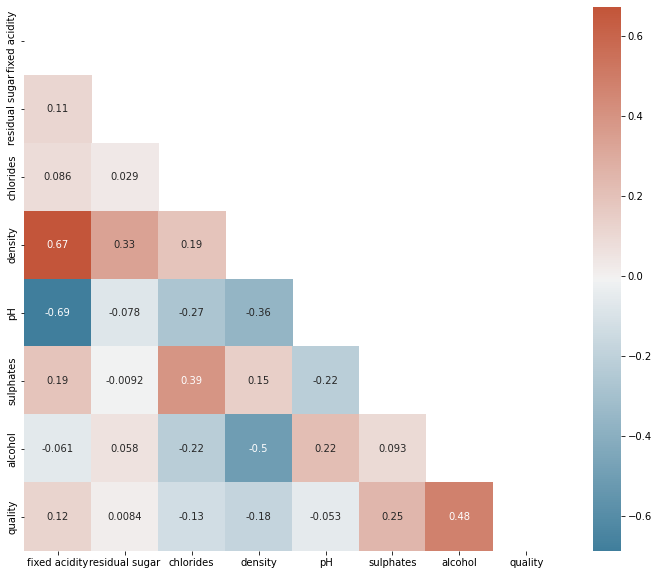

In [ ]:
corr = dataset1.corr()
#
# Set up the matplotlib plot configuration
#
f, ax = plt.subplots(figsize=(12, 10))
#
# Generate a mask for upper traingle
#
mask = np.triu(np.ones_like(corr, dtype=bool))
#
# Configure a custom diverging colormap
#
cmap = sns.diverging_palette(230, 20, as_cmap=True)
#
# Draw the heatmap
#
sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

**Constructing a model**

Splitting the dataset into training and testing sets in a 80:20 ratio

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size = 0.20, random_state = 42)

In [ ]:
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression()

Storing the predicted values in y_pred

In [ ]:
y_pred = regressor.predict(X_test)

In [ ]:
y_train_pred = regressor.predict(X_train)

Creating a dataframe of predicted and test values for better comparison

In [ ]:
d = {'y_pred': y_pred, 'y_test': y_test}

In [ ]:
pd.DataFrame(d)

,y_pred,y_test
55,5.140847,5
1291,5.937119,6
1544,6.220567,7
593,5.064702,5
1090,6.361779,8
...,...,...
1086,6.036131,7
662,5.367859,6
279,5.692881,7
1111,5.853456,7


**RMSE**



The root-mean-square error (RMSE) is a frequently used measure of the differences between values (sample and population values) predicted by a model and the values actually observed. 

The RMSE for training and test sets should be **very similar** if we have built a good model. If the RMSE for the test set is much higher than that of the training set, it is likely that we’ve badly overfit the data.

It is in absolute terms




In [ ]:
from sklearn import metrics
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_pred)))

RMSE: 0.6819158358621954


In [ ]:
from sklearn import metrics
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

RMSE: 0.6960133440155453


After Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train = sc.fit_transform(X_train)
x_test = sc.transform(X_test)
print(x_train)

[[ 0.35352887 -0.23415792 -0.40971048 ... -0.26676043  0.50604494
   1.97422269]
 [-0.97435746  0.06474952  0.30265236 ...  0.82258508 -0.46320516
  -0.21602164]
 [-0.85888908 -0.60779221 -0.10976823 ...  0.82258508 -0.1781316
  -0.398542  ]
 ...
 [-0.68568652 -0.60779221 -0.35347131 ... -0.13860213 -0.00708746
   0.33153944]
 [ 0.35352887 -0.38361164 -0.03478267 ... -0.90755191 -0.63424929
  -0.03350128]
 [ 0.46899725 -0.53306535 -0.5596816  ... -0.84347276  0.90514792
   0.5140598 ]]


Fitting the data into the model

In [ ]:
regressor = LinearRegression()
regressor.fit(x_train, y_train)

LinearRegression()

In [ ]:
y_pred = regressor.predict(x_test)

In [ ]:
y_train_pred = regressor.predict(x_train)

In [ ]:
d = {'y_pred': y_pred, 'y_test': y_test}

In [ ]:
pd.DataFrame(d)

,y_pred,y_test
55,5.140847,5
1291,5.937119,6
1544,6.220567,7
593,5.064702,5
1090,6.361779,8
...,...,...
1086,6.036131,7
662,5.367859,6
279,5.692881,7
1111,5.853456,7


In [ ]:
from sklearn import metrics
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_pred)))

RMSE: 0.6819158358621953


In [ ]:
from sklearn import metrics
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

RMSE: 0.6960133440155453


#Dataset 3

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split

from sklearn import linear_model

from sklearn.metrics import r2_score

%matplotlib inline

# !pip install pandas-profiling==2.7.1
!pip install https://github.com/ydataai/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     | 21.8 MB 71 kB/s
     |████████████████████████████████| 596 kB 7.6 MB/s 
     |████████████████████████████████| 102 kB 56.3 MB/s 
     |████████████████████████████████| 690 kB 32.2 MB/s 
     |████████████████████████████████| 4.7 MB 42.3 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 812 kB 24.5 MB/s 
     |████████████████████████████████| 38.1 MB 1.4 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=262599 sha256=c40365a5435c29b5775c7eb0cd0c524daccab28d5799fd32d2b2cf8f27b14f02
  Stored in directory: /tmp/pip-ephem-wheel-cache-vikvu_3k/wheels/c3/aa/10/94ee985ca5a122f047c430cf991df62fe210c4789d3b5762a5
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=98a3d4670d6b1d98dea600da37571d1589dce5d791f018cd82e0b5e0bfc09894
  Stored in directory

In [ ]:
dataset = pd.read_csv("https://raw.githubusercontent.com/sanithps98/Automobile-Dataset-Analysis/master/clean_df.csv")

# taking the dataset from UCI: https://archive.ics.uci.edu/ml/machine-learning-databases/autos/
# we are taking the formatted dataset from github

In [ ]:
dataset.head()

,Unnamed: 0,symboling,normalized-losses,make,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,length,...,highway-mpg,price,city-L/100km,horsepower-binned,diesel,gas,aspiration-std,aspiration-turbo,aspiration-std.1,aspiration-turbo.1
0,0,3,122,alfa-romero,two,convertible,rwd,front,88.6,0.811148,...,8.703704,13495.0,11.190476,Low,0,1,1,0,1,0
1,1,3,122,alfa-romero,two,convertible,rwd,front,88.6,0.811148,...,8.703704,16500.0,11.190476,Low,0,1,1,0,1,0
2,2,1,122,alfa-romero,two,hatchback,rwd,front,94.5,0.822681,...,9.038462,16500.0,12.368421,Medium,0,1,1,0,1,0
3,3,2,164,audi,four,sedan,fwd,front,99.8,0.848630,...,7.833333,13950.0,9.791667,Low,0,1,1,0,1,0
4,4,2,164,audi,four,sedan,4wd,front,99.4,0.848630,...,10.681818,17450.0,13.055556,Low,0,1,1,0,1,0


In [ ]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201 entries, 0 to 200
Data columns (total 33 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          201 non-null    int64  
 1   symboling           201 non-null    int64  
 2   normalized-losses   201 non-null    int64  
 3   make                201 non-null    object 
 4   num-of-doors        201 non-null    object 
 5   body-style          201 non-null    object 
 6   drive-wheels        201 non-null    object 
 7   engine-location     201 non-null    object 
 8   wheel-base          201 non-null    float64
 9   length              201 non-null    float64
 10  width               201 non-null    float64
 11  height              201 non-null    float64
 12  curb-weight         201 non-null    int64  
 13  engine-type         201 non-null    object 
 14  num-of-cylinders    201 non-null    object 
 15  engine-size         201 non-null    int64  
 16  fuel-sys

In [ ]:
dataset.isnull().sum()

Unnamed: 0            0
symboling             0
normalized-losses     0
make                  0
num-of-doors          0
body-style            0
drive-wheels          0
engine-location       0
wheel-base            0
length                0
width                 0
height                0
curb-weight           0
engine-type           0
num-of-cylinders      0
engine-size           0
fuel-system           0
bore                  0
stroke                0
compression-ratio     0
horsepower            0
peak-rpm              0
city-mpg              0
highway-mpg           0
price                 0
city-L/100km          0
horsepower-binned     0
diesel                0
gas                   0
aspiration-std        0
aspiration-turbo      0
aspiration-std.1      0
aspiration-turbo.1    0
dtype: int64

-----------

# Profile report

In [ ]:
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pandas_profiling import ProfileReport
ProfileReport(dataset)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

                    Unnamed: 0  symboling  normalized-losses  wheel-base  \
Unnamed: 0            1.000000  -0.162764          -0.241092    0.125517   
symboling            -0.162764   1.000000           0.466264   -0.535987   
normalized-losses    -0.241092   0.466264           1.000000   -0.056661   
wheel-base            0.125517  -0.535987          -0.056661    1.000000   
length                0.161848  -0.365404           0.019424    0.876024   
width                 0.043976  -0.242423           0.086802    0.814507   
height                0.252015  -0.550160          -0.373737    0.590742   
curb-weight           0.064820  -0.233118           0.099404    0.782097   
engine-size          -0.047764  -0.110581           0.112360    0.572027   
bore                  0.244734  -0.140019          -0.029862    0.493244   
stroke               -0.162490  -0.008153           0.055045    0.158018   
compression-ratio     0.144301  -0.182196          -0.114713    0.250313   
horsepower  

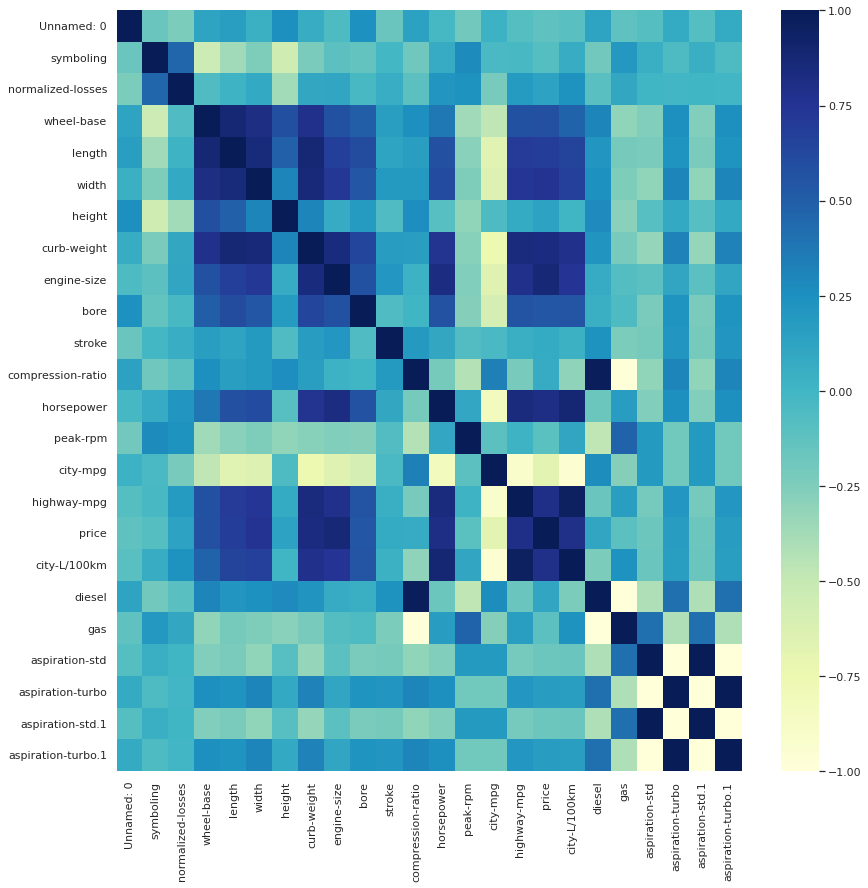

In [ ]:
print(dataset.corr())
  
# plotting correlation heatmap
sns.set(rc={'figure.figsize':(14,14)})

dataplot = sns.heatmap(dataset.corr(), cmap="YlGnBu")

# Choosing sub dataset

In [ ]:
df = dataset[["make", "horsepower", "highway-mpg", "price"]]
X = df[["make", "horsepower", "highway-mpg"]]
y = df["price"]

# Plotting some graphs

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


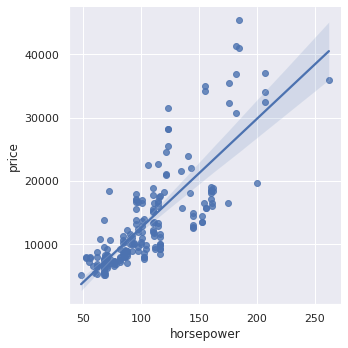

In [ ]:
g = sns.lmplot('horsepower',"price", dataset);

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


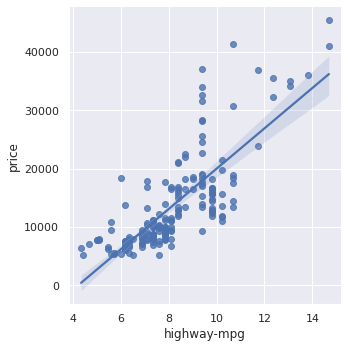

In [ ]:
g = sns.lmplot('highway-mpg',"price", df);

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y, data. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


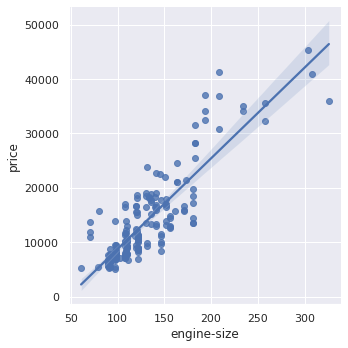

In [ ]:
g = sns.lmplot('engine-size',"price", dataset);

# Label encoding 'make' column

In [ ]:
make_dummy = pd.get_dummies(dataset["make"])
X = X.drop("make", axis = 1)
X = pd.concat([X, make_dummy], axis = 1)

In [ ]:
X

,horsepower,highway-mpg,alfa-romero,audi,bmw,chevrolet,dodge,honda,isuzu,jaguar,...,nissan,peugot,plymouth,porsche,renault,saab,subaru,toyota,volkswagen,volvo
0,111,8.703704,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,111,8.703704,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,154,9.038462,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,102,7.833333,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,115,10.681818,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,114,8.392857,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
197,160,9.400000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
198,134,10.217391,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
199,106,8.703704,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
# split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

# choosing the model, creating an obj
model = linear_model.LinearRegression()

# fitting the model
model.fit(X_train, y_train)

LinearRegression()

In [ ]:
print("X_train:\n", X_train)

X_train:
      horsepower  highway-mpg  alfa-romero  audi  bmw  chevrolet  dodge  honda  \
96           97     6.911765            0     0    0          0      0      0   
181          85     6.911765            0     0    0          0      0      0   
19           70     5.465116            0     0    0          1      0      0   
153          70     6.351351            0     0    0          0      0      0   
92           69     6.351351            0     0    0          0      0      0   
..          ...          ...          ...   ...  ...        ...    ...    ...   
67          123     9.400000            0     0    0          0      0      0   
192         114     8.392857            0     0    0          0      0      0   
117          68     6.184211            0     0    0          0      0      0   
47           68     7.580645            0     0    0          0      0      0   
172          92     7.343750            0     0    0          0      0      0   

     isuzu  jagua

In [ ]:
print("X_test shape:\n", X_test)

X_test shape:
      horsepower  highway-mpg  alfa-romero  audi  bmw  chevrolet  dodge  honda  \
18           70     5.465116            0     0    0          1      0      0   
170          73     7.121212            0     0    0          0      0      0   
107          95     9.400000            0     0    0          0      0      0   
98          152    10.681818            0     0    0          0      0      0   
177         156     9.791667            0     0    0          0      0      0   
..          ...          ...          ...   ...  ...        ...    ...    ...   
30           76     6.184211            0     0    0          0      0      1   
160          70     6.911765            0     0    0          0      0      0   
40          101     8.392857            0     0    0          0      0      1   
56           84     7.343750            0     0    0          0      0      0   
131         110     8.392857            0     0    0          0      0      0   

     isuzu  

In [ ]:
print("y_train shape:\n", y_train)

y_train shape:
 96      8949.0
181     8195.0
19      6575.0
153     7198.0
92      7799.0
        ...   
67     31600.0
192    15985.0
117     6229.0
47      5195.0
172    10898.0
Name: price, Length: 140, dtype: float64


In [ ]:
print("y_test shape:\n", y_test)

y_test shape:
 18      6295.0
170    10698.0
107    13860.0
98     13499.0
177    15750.0
        ...   
30      6855.0
160     8238.0
40     12945.0
56      8845.0
131    15510.0
Name: price, Length: 61, dtype: float64


In [ ]:
# predict
y_pred = model.predict(X_test)

# Model Evaluation

In statistics, the coefficient of determination, denoted R2, is the proportion of the variation in the dependent variable that is predictable from the independent variable(s). 

---



In [ ]:
score = r2_score(y_test, y_pred)
print(score)

0.8165291973607314


In our demonstration we are getting a R² value of 0.81, meaning 81% of the variation in the dependent variable (i.e. used car price) can be explained by the three independent variables (i.e. make, horsepower and highway-mpg).

# Another example

In [ ]:
df = dataset[["curb-weight", "horsepower", "highway-mpg", "width"]]
y = dataset["price"]

In [ ]:
#Fit the linear model
model.fit(df, dataset['price'])

LinearRegression()

In [ ]:
print(model.intercept_)
print(model.coef_)

-55027.94598742823
[4.98000312e+00 8.64807453e+01 2.42138356e+02 4.87555804e+04]




Price = -1.8189894035458565e-12 + (-4.40185373e-15) x curb-weight + 4.69878948 x horsepower + -2.29459057e-13 x highway-mpg + 1.000 x width


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


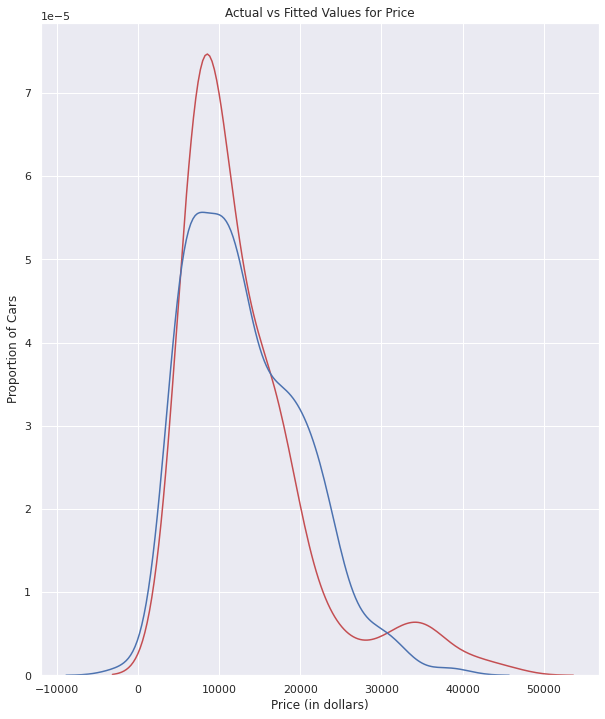

In [ ]:
Ypredict = model.predict(df)
plt.figure(figsize=(10,12))

ax1 = sns.distplot(dataset['price'], hist=False,color="r", label="Actual Values")
sns.distplot(Ypredict, hist=False, color="b", label="Fitted Values", ax=ax1)

plt.title("Actual vs Fitted Values for Price")
plt.xlabel("Price (in dollars)")
plt.ylabel("Proportion of Cars")

plt.show()
plt.close()


In [ ]:
# split data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

# choosing the model, creating an obj
model = linear_model.LinearRegression()

# fitting the model
model.fit(X_train, y_train)

LinearRegression()

In [ ]:
# predict
y_pred = model.predict(X_test)

In [ ]:
score = r2_score(y_test, y_pred)
print(score)

0.8165291973607314
